<a href="https://colab.research.google.com/github/Chaitanya081/DSA0205_Computer-Vision-with-OpenCV/blob/main/CO5_AT1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1.Face Detection using Haar Cascades

Creating new Ultralytics Settings v0.0.7 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.

0: 640x512 (no detections), 385.5ms
Speed: 9.6ms preprocess, 385.5ms inference, 19.3ms postprocess per image at shape (1, 3, 640, 512)


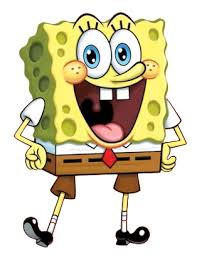

Face detection completed!


In [ ]:
from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow

model = YOLO("yolov8n.pt")

filename = list(uploaded.keys())[0]

image = cv2.imread(filename)

results = model(image)

output = results[0].plot()

cv2_imshow(output)

print("Face detection completed!")

2. Live Facial Expression Recognition

In [ ]:
!pip install -q deepface

In [ ]:
!pip install -q transformers torch torchvision

In [ ]:
from google.colab import files
from transformers import pipeline
from PIL import Image

uploaded = files.upload()

filename = list(uploaded.keys())[0]

image = Image.open(filename).convert("RGB")

classifier = pipeline(
    "image-classification",
    model="dima806/facial_emotions_image_detection"
)

result = classifier(image)

print("Detected Emotion:", result[0]["label"])
print("Confidence:", round(result[0]["score"] * 100, 2), "%")

Saving image1.jpg to image1 (1).jpg


config.json:   0%|          | 0.00/907 [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  343MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/200 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/578 [00:00<?, ?B/s]

Detected Emotion: fear
Confidence: 41.03 %


3. OCR Pipeline for Scanned Document Text Extraction

In [ ]:
!apt-get -qq update
!apt-get -qq install tesseract-ocr
!pip install -q pytesseract

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)


Saving image1.jpg to image1 (2).jpg
Extracted Text:
 



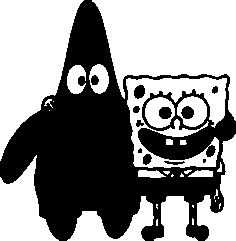

In [ ]:
from google.colab import files
import cv2
import pytesseract
from google.colab.patches import cv2_imshow

uploaded = files.upload()

filename = list(uploaded.keys())[0]

image = cv2.imread(filename)

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

gray = cv2.GaussianBlur(gray, (3, 3), 0)

_, processed = cv2.threshold(
    gray,
    0,
    255,
    cv2.THRESH_BINARY + cv2.THRESH_OTSU
)

text = pytesseract.image_to_string(processed)

print("Extracted Text:")
print(text)

cv2_imshow(processed)

4. Real-Time Video Surveillance Motion-Alert System

In [ ]:
from google.colab import files

uploaded = files.upload()

filename = list(uploaded.keys())[0]

Saving video1.mp4 to video1.mp4


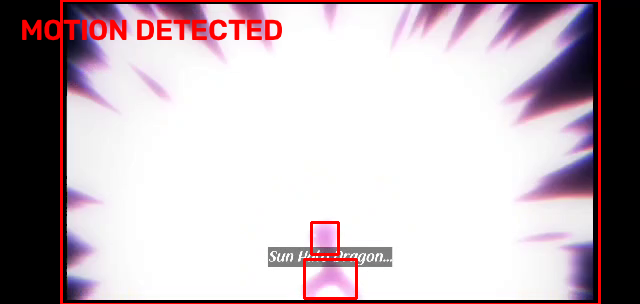

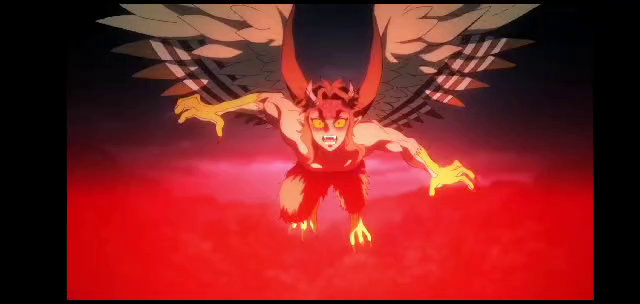

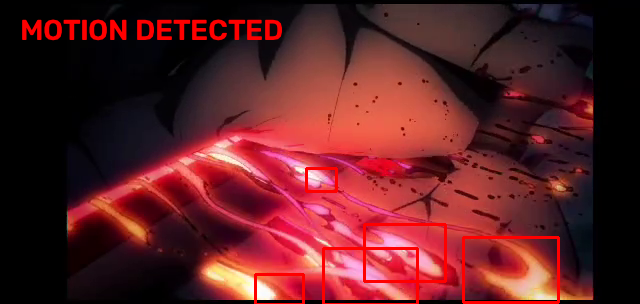

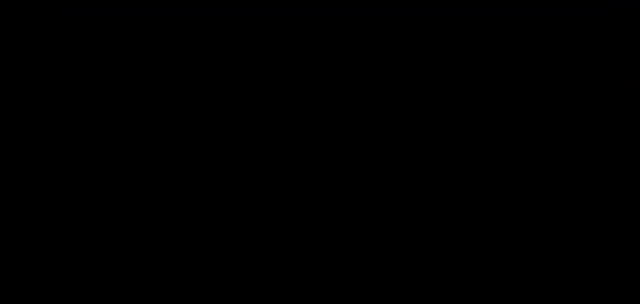

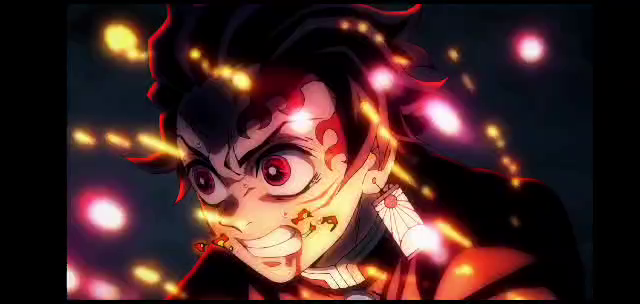

...

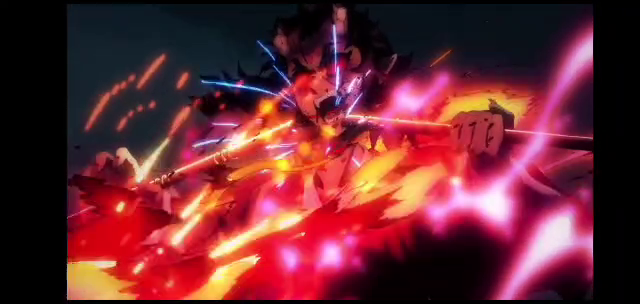

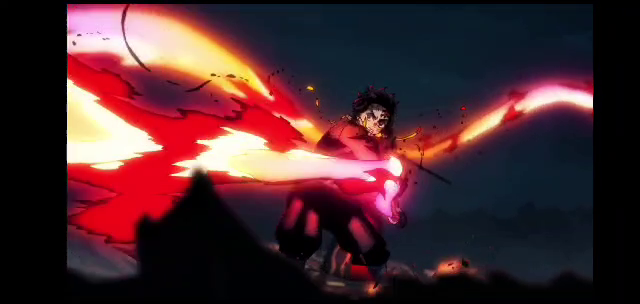

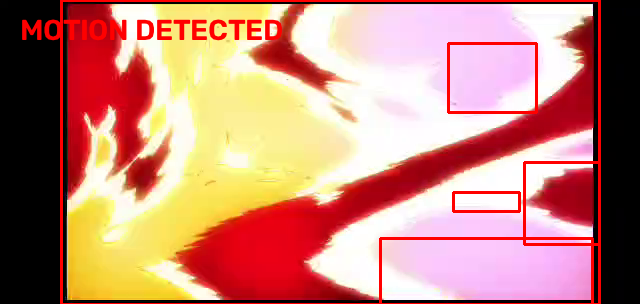

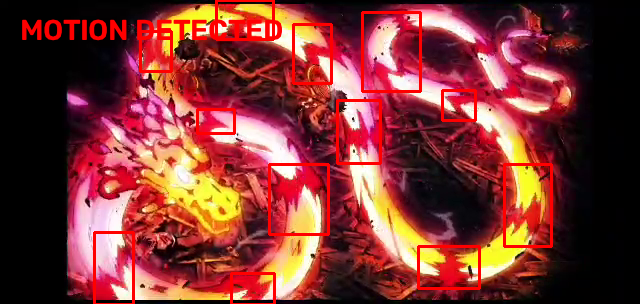

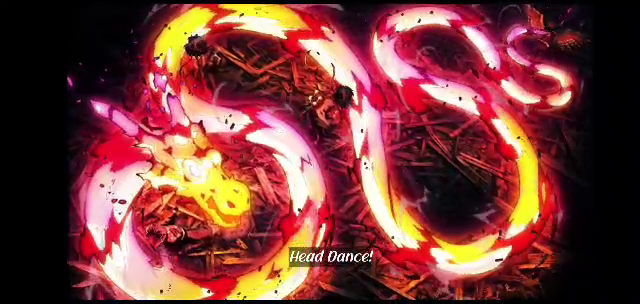

Video processing completed!
Motion detected in 390 frames


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

cap = cv2.VideoCapture(filename)

previous_frame = None
motion_count = 0
frame_count = 0

while True:
    ret, frame = cap.read()

    if not ret:
        break

    frame_count += 1

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (21, 21), 0)

    if previous_frame is None:
        previous_frame = gray
        continue

    difference = cv2.absdiff(previous_frame, gray)

    _, threshold = cv2.threshold(
        difference,
        25,
        255,
        cv2.THRESH_BINARY
    )

    threshold = cv2.dilate(
        threshold,
        None,
        iterations=2
    )

    contours, _ = cv2.findContours(
        threshold,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    motion_detected = False

    for contour in contours:
        if cv2.contourArea(contour) < 500:
            continue

        x, y, w, h = cv2.boundingRect(contour)

        cv2.rectangle(
            frame,
            (x, y),
            (x + w, y + h),
            (0, 0, 255),
            2
        )

        motion_detected = True

    if motion_detected:
        motion_count += 1

        cv2.putText(
            frame,
            "MOTION DETECTED",
            (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX,
            1,
            (0, 0, 255),
            2
        )

    previous_frame = gray

    if frame_count % 30 == 0:
        cv2_imshow(frame)

cap.release()

print("Video processing completed!")
print("Motion detected in", motion_count, "frames")

5. Interactive Drawing / Annotation Tool

In [ ]:
from google.colab import files

uploaded = files.upload()

filename = list(uploaded.keys())[0]

Saving image1.jpg to image1 (3).jpg


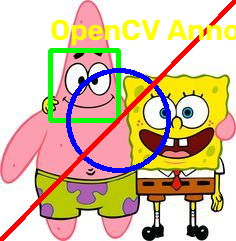

Annotation completed!
Saved as: annotated_image.jpg


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

image = cv2.imread(filename)

h, w = image.shape[:2]

cv2.rectangle(
    image,
    (50, 50),
    (w // 2, h // 2),
    (0, 255, 0),
    3
)

cv2.circle(
    image,
    (w // 2, h // 2),
    50,
    (255, 0, 0),
    3
)

cv2.line(
    image,
    (0, h - 1),
    (w - 1, 0),
    (0, 0, 255),
    3
)

cv2.putText(
    image,
    "OpenCV Annotation",
    (50, 40),
    cv2.FONT_HERSHEY_SIMPLEX,
    1,
    (0, 255, 255),
    2
)

cv2_imshow(image)

cv2.imwrite(
    "annotated_image.jpg",
    image
)

print("Annotation completed!")
print("Saved as: annotated_image.jpg")

6. Live Edge-Detection Video Filter

In [ ]:
from google.colab import files

uploaded = files.upload()

filename = list(uploaded.keys())[0]

Saving video1.mp4 to video1 (1).mp4


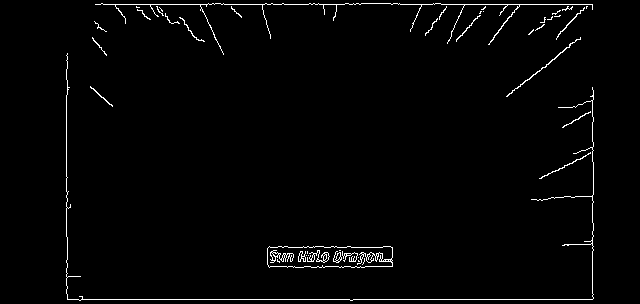

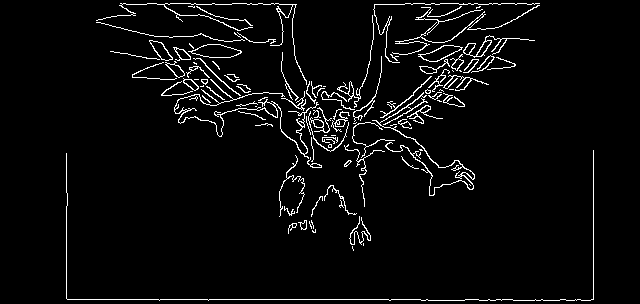

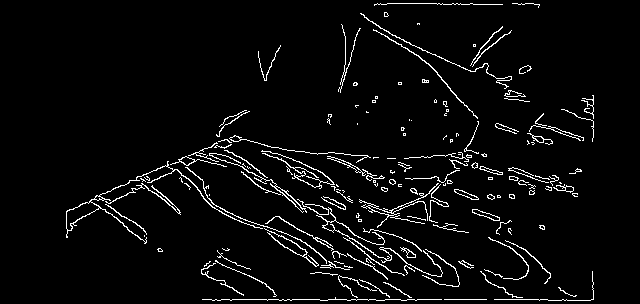

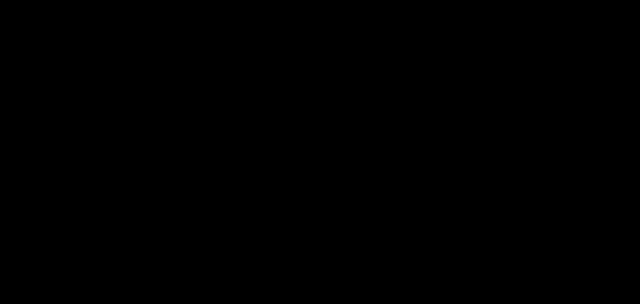

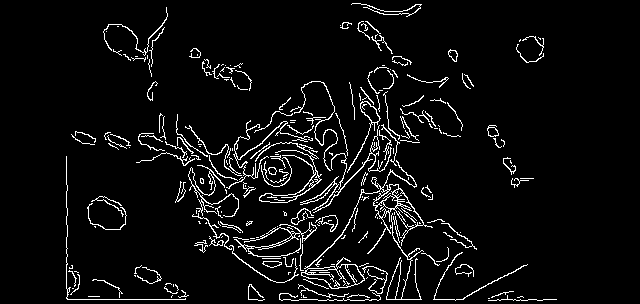

...

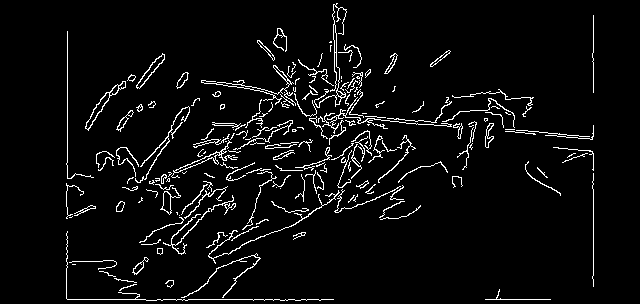

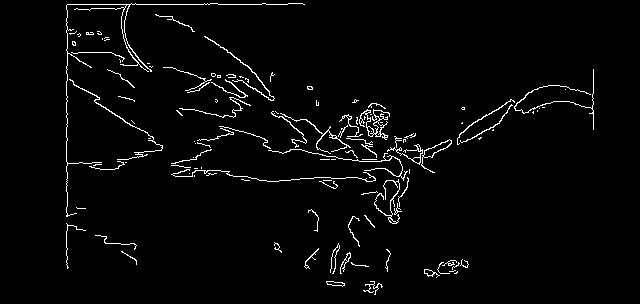

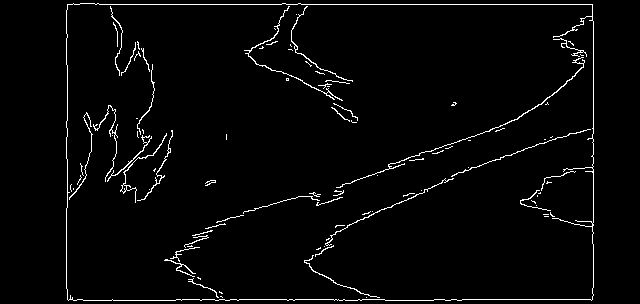

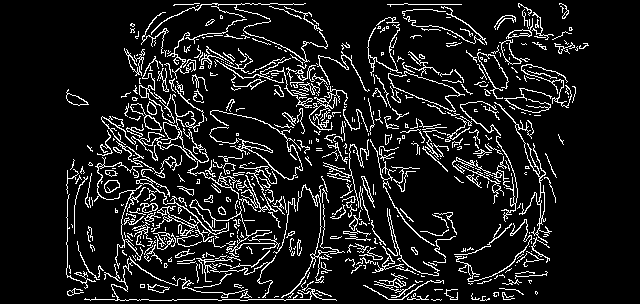

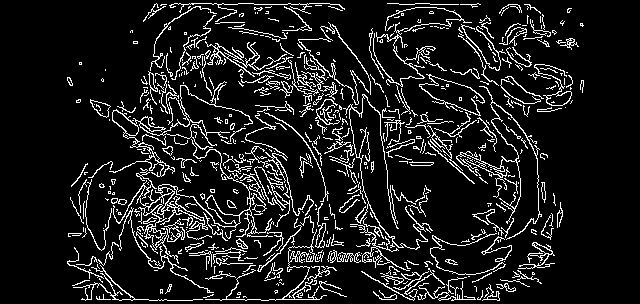

Edge detection completed!
Frames processed: 654


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

cap = cv2.VideoCapture(filename)

frame_count = 0

while True:
    ret, frame = cap.read()

    if not ret:
        break

    frame_count += 1

    gray = cv2.cvtColor(
        frame,
        cv2.COLOR_BGR2GRAY
    )

    edges = cv2.Canny(
        gray,
        100,
        200
    )

    if frame_count % 30 == 0:
        cv2_imshow(edges)

cap.release()

print("Edge detection completed!")
print("Frames processed:", frame_count)

7. Real-Time Object-Tracking Pipeline

In [ ]:
from google.colab import files

uploaded = files.upload()

filename = list(uploaded.keys())[0]

Saving image1.jpg to image1 (4).jpg


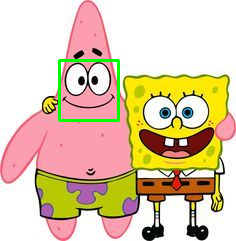

Object selected for tracking!


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

image = cv2.imread(filename)

h, w = image.shape[:2]

x = w // 4
y = h // 4
box_w = w // 4
box_h = h // 4

template = image[y:y + box_h, x:x + box_w]

cv2.rectangle(
    image,
    (x, y),
    (x + box_w, y + box_h),
    (0, 255, 0),
    2
)

cv2_imshow(image)

cv2.imwrite("tracking_selection.jpg", image)

print("Object selected for tracking!")

In [ ]:
from google.colab import files

uploaded_video = files.upload()

video_name = list(uploaded_video.keys())[0]

Saving video1.mp4 to video1 (2).mp4


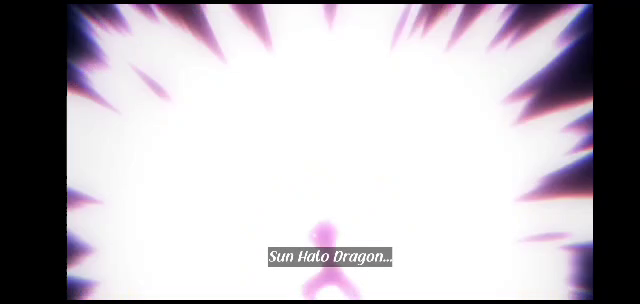

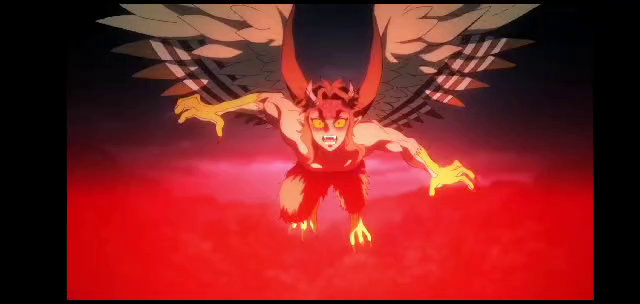

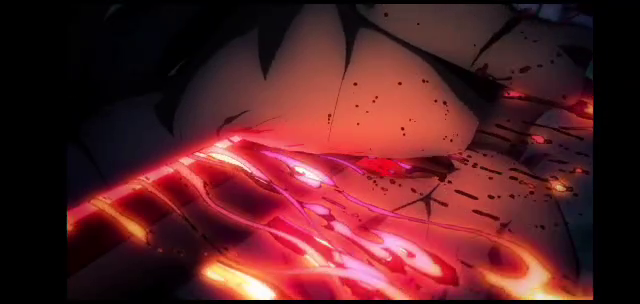

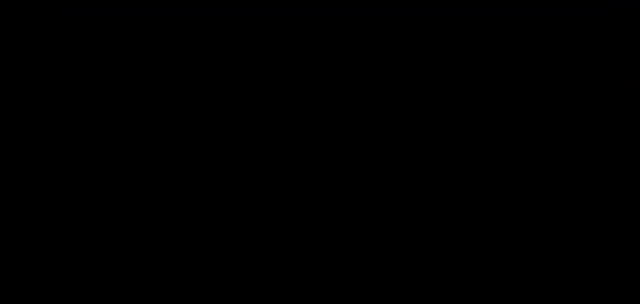

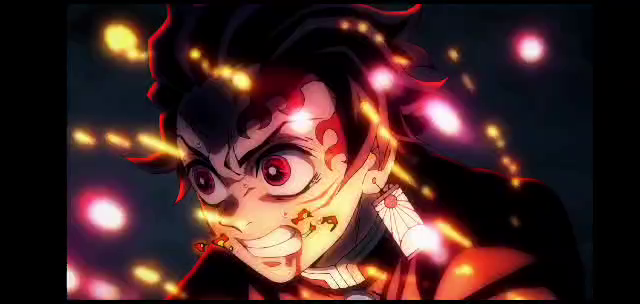

...

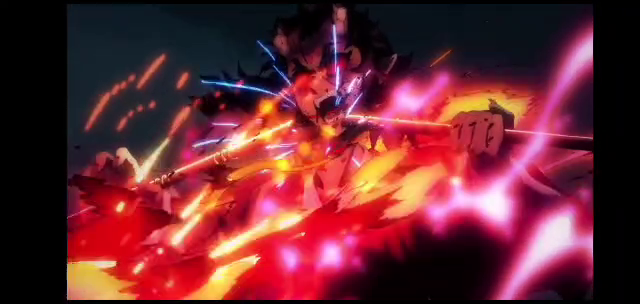

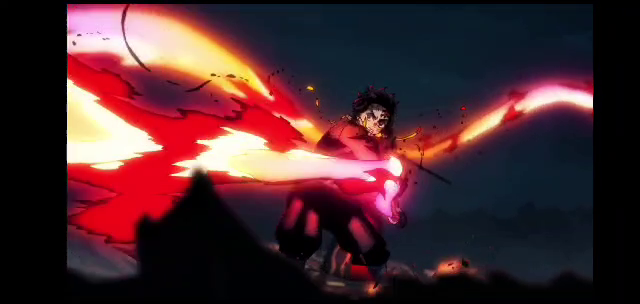

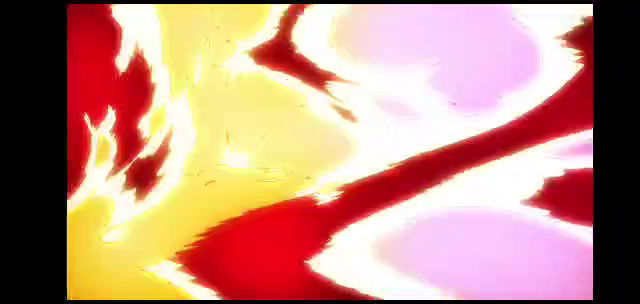

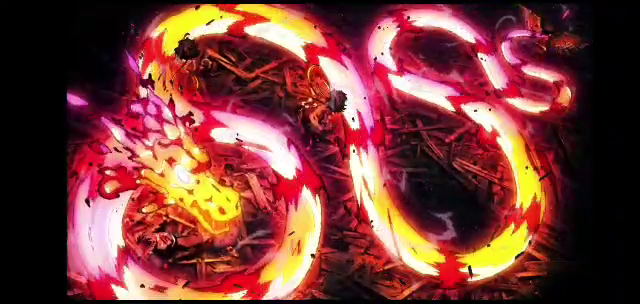

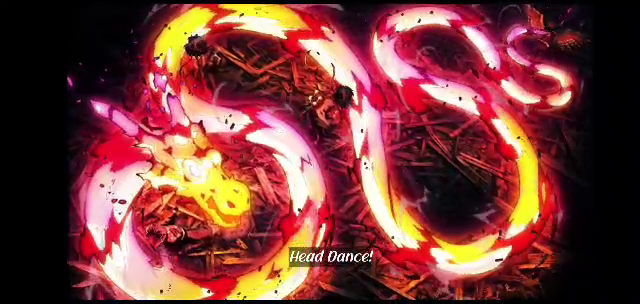

Tracking completed!
Frames processed: 654
Frames with object tracked: 0


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

cap = cv2.VideoCapture(video_name)

frame_count = 0
tracked_count = 0

template_gray = cv2.cvtColor(
    template,
    cv2.COLOR_BGR2GRAY
)

while True:
    ret, frame = cap.read()

    if not ret:
        break

    frame_count += 1

    gray = cv2.cvtColor(
        frame,
        cv2.COLOR_BGR2GRAY
    )

    result = cv2.matchTemplate(
        gray,
        template_gray,
        cv2.TM_CCOEFF_NORMED
    )

    _, max_value, _, max_location = cv2.minMaxLoc(result)

    if max_value > 0.5:
        tracked_count += 1

        x1, y1 = max_location

        cv2.rectangle(
            frame,
            (x1, y1),
            (x1 + box_w, y1 + box_h),
            (0, 255, 0),
            2
        )

        cv2.putText(
            frame,
            "Object Tracked",
            (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX,
            1,
            (0, 255, 0),
            2
        )

    if frame_count % 30 == 0:
        cv2_imshow(frame)

cap.release()

print("Tracking completed!")
print("Frames processed:", frame_count)
print("Frames with object tracked:", tracked_count)

8. Feature-Matching Demo for Object Recognition

In [ ]:
from google.colab import files

uploaded = files.upload()

reference_name = list(uploaded.keys())[0]

Saving image1.jpg to image1 (5).jpg


In [ ]:
uploaded = files.upload()

test_name = list(uploaded.keys())[0]

Saving image.jpg to image (2).jpg


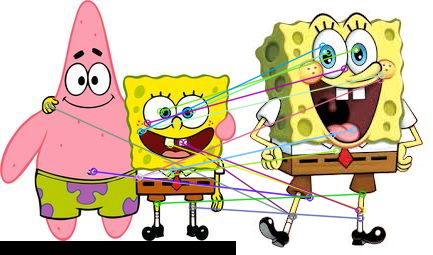

Total matches: 120
Good matches: 17
Object recognized!


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

reference = cv2.imread(reference_name)
test = cv2.imread(test_name)

gray1 = cv2.cvtColor(
    reference,
    cv2.COLOR_BGR2GRAY
)

gray2 = cv2.cvtColor(
    test,
    cv2.COLOR_BGR2GRAY
)

orb = cv2.ORB_create()

keypoints1, descriptors1 = orb.detectAndCompute(
    gray1,
    None
)

keypoints2, descriptors2 = orb.detectAndCompute(
    gray2,
    None
)

if descriptors1 is None or descriptors2 is None:
    print("No features detected.")
else:

    matcher = cv2.BFMatcher(
        cv2.NORM_HAMMING,
        crossCheck=True
    )

    matches = matcher.match(
        descriptors1,
        descriptors2
    )

    matches = sorted(
        matches,
        key=lambda x: x.distance
    )

    good_matches = [
        match for match in matches
        if match.distance < 60
    ]

    result = cv2.drawMatches(
        reference,
        keypoints1,
        test,
        keypoints2,
        good_matches[:30],
        None,
        flags=2
    )

    cv2_imshow(result)

    print("Total matches:", len(matches))
    print("Good matches:", len(good_matches))

    if len(good_matches) > 10:
        print("Object recognized!")
    else:
        print("Object not recognized.")

9. Automated License-Plate Region Localization

In [ ]:
from google.colab import files

uploaded = files.upload()

filename = list(uploaded.keys())[0]

Saving image1.jpg to image1 (6).jpg


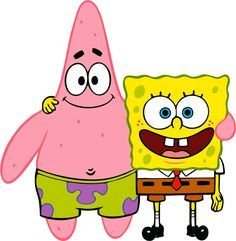

License plate region not detected.


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

image = cv2.imread(filename)

gray = cv2.cvtColor(
    image,
    cv2.COLOR_BGR2GRAY
)

gray = cv2.bilateralFilter(
    gray,
    11,
    17,
    17
)

edges = cv2.Canny(
    gray,
    30,
    200
)

contours, _ = cv2.findContours(
    edges,
    cv2.RETR_TREE,
    cv2.CHAIN_APPROX_SIMPLE
)

contours = sorted(
    contours,
    key=cv2.contourArea,
    reverse=True
)[:30]

plate_found = False

for contour in contours:

    perimeter = cv2.arcLength(
        contour,
        True
    )

    approximation = cv2.approxPolyDP(
        contour,
        0.018 * perimeter,
        True
    )

    if len(approximation) == 4:

        x, y, w, h = cv2.boundingRect(
            approximation
        )

        ratio = w / float(h)

        if 2 < ratio < 6:

            cv2.rectangle(
                image,
                (x, y),
                (x + w, y + h),
                (0, 255, 0),
                3
            )

            cv2.putText(
                image,
                "License Plate",
                (x, y - 10),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.8,
                (0, 255, 0),
                2
            )

            plate_found = True

            break

cv2_imshow(image)

if plate_found:
    print("License plate region detected!")
else:
    print("License plate region not detected.")

10. Real-Time Background-Subtraction Surveillance Pipeline

In [ ]:
from google.colab import files

uploaded = files.upload()

filename = list(uploaded.keys())[0]

Saving image1.jpg to image1 (7).jpg


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

cap = cv2.VideoCapture(filename)

background_subtractor = cv2.createBackgroundSubtractorMOG2(
    history=500,
    varThreshold=50,
    detectShadows=True
)

frame_count = 0
foreground_count = 0

while True:

    ret, frame = cap.read()

    if not ret:
        break

    frame_count += 1

    mask = background_subtractor.apply(frame)

    _, mask = cv2.threshold(
        mask,
        200,
        255,
        cv2.THRESH_BINARY
    )

    contours, _ = cv2.findContours(
        mask,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    output = frame.copy()

    detected = False

    for contour in contours:

        if cv2.contourArea(contour) < 500:
            continue

        x, y, w, h = cv2.boundingRect(contour)

        cv2.rectangle(
            output,
            (x, y),
            (x + w, y + h),
            (0, 255, 0),
            2
        )

        detected = True

    if detected:
        foreground_count += 1

        cv2.putText(
            output,
            "OBJECT DETECTED",
            (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX,
            1,
            (0, 0, 255),
            2
        )

    if frame_count % 30 == 0:
        cv2_imshow(output)

cap.release()

print("Background subtraction completed!")
print("Frames processed:", frame_count)
print("Frames containing foreground:", foreground_count)

Background subtraction completed!
Frames processed: 1
Frames containing foreground: 0


11. Multi-Face Detection and Counting Pipeline

In [1]:
!pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 27.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.2/53.2 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.3/65.3 kB 3.2 MB/s eta 0:00:00


In [6]:
!wget -q -O /content/people.jpg https://ultralytics.com/images/bus.jpg


0: 640x480 4 persons, 1 bus, 711.0ms
Speed: 14.4ms preprocess, 711.0ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 480)


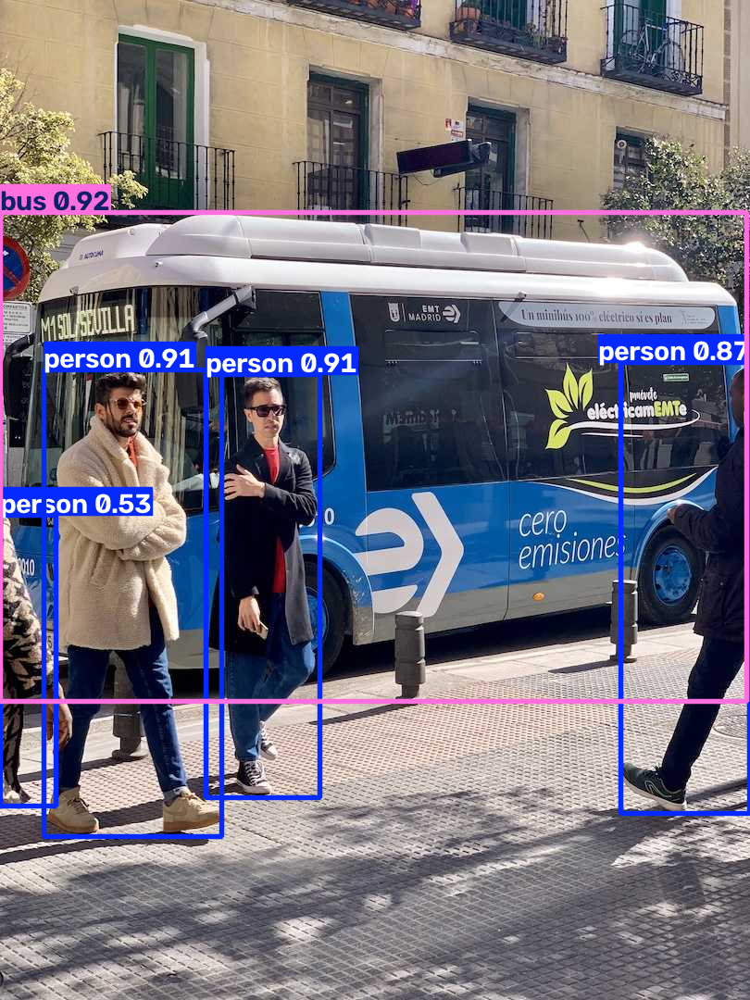

Number of people detected: 4


In [8]:
from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow

model = YOLO("yolo26n.pt")

image = cv2.imread("/content/people.jpg")

results = model(image)

output = results[0].plot()

person_count = 0

for box in results[0].boxes:
    class_id = int(box.cls[0])
    if class_id == 0:
        person_count += 1

cv2_imshow(output)

print("Number of people detected:", person_count)

12. Complete Image-to-Video Processing Pipeline

In [10]:
from google.colab import files

uploaded = files.upload()

filename = list(uploaded.keys())[0]

Saving video1.mp4 to video1.mp4


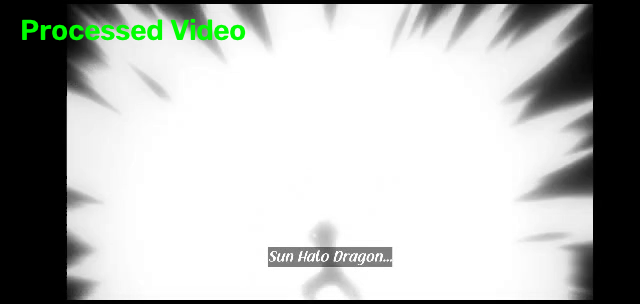

Video processing completed!
Frames processed: 654
Output file: /content/processed_video.mp4


In [11]:
import cv2
from google.colab.patches import cv2_imshow

cap = cv2.VideoCapture(filename)

width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)

if fps <= 0:
    fps = 25

output_file = "/content/processed_video.mp4"

fourcc = cv2.VideoWriter_fourcc(*"mp4v")

writer = cv2.VideoWriter(
    output_file,
    fourcc,
    fps,
    (width, height)
)

frame_count = 0

while True:

    ret, frame = cap.read()

    if not ret:
        break

    frame_count += 1

    gray = cv2.cvtColor(
        frame,
        cv2.COLOR_BGR2GRAY
    )

    processed = cv2.cvtColor(
        gray,
        cv2.COLOR_GRAY2BGR
    )

    cv2.putText(
        processed,
        "Processed Video",
        (20, 40),
        cv2.FONT_HERSHEY_SIMPLEX,
        1,
        (0, 255, 0),
        2
    )

    writer.write(processed)

    if frame_count == 30:
        cv2_imshow(processed)

cap.release()
writer.release()

print("Video processing completed!")
print("Frames processed:", frame_count)
print("Output file:", output_file)

In [12]:
from google.colab import files

files.download("/content/processed_video.mp4")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>